In [1]:

import matplotlib.pyplot as plt

import pandas as pd
import time

from alphabt import *


# 作多

In [2]:

Data.datasource = 'yfapi'
data = Data().get_data(ticker='T', startdate='2000', enddate='2020')

# 回測策略:
  * 5MA、25MA 黃金交叉 以及 成交量大於20MA成交量
  * 5MA、25MA 死叉

### 單純作多

In [3]:


class MyStrategy(Strategy):
    
    def __init__(self):
        self.data = data
        self.tema_8 = self.indicator('TEMA', 8)['TEMA'].values
        self.tema_13 = self.indicator('TEMA', 13)['TEMA'].values

        
    def signal(self, index):

        super().signal(index)
        # Only buy the stock with empty position
        if (self.tema_8[index] > self.tema_13[index]) & (self.empty_position):
            self.long()
        # Only sell with long position
        if (self.tema_13[index] > self.tema_8[index]) & (self.long_position):
            self.close()
        
    
    



In [4]:
%%time
bt = Backtest(MyStrategy, initital_equity=10000, commission=None)
bt.run()


CPU times: user 806 ms, sys: 2.04 ms, total: 808 ms
Wall time: 807 ms


In [5]:
trading_report, yearly_report = bt.get_report()



/Users/apple/Documents/PythonProject/alphabt/alphabt/common/statistic.py:118: FutureWarning:

Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.



-----------------------------|
sharpe ratio | -0.261 --------|
-----------------------------|
calmar ratio | 0.0 --------|
-----------------------------|


/Users/apple/Documents/PythonProject/alphabt/alphabt/report/report.py:83: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



In [6]:
trading_report

,Ticket,unit,action,EntryDate,EntryPrice,EntryCommission,Type,ExitDate,ExitPrice,Tax,ExitCommission,Equity,DurationDate,profit($),ROI(%),AccumulateROI(%),MDD(%),EquityReturn,EquityAccumulateReturn
0,T,1,long,2000-03-01,30.26,0.0,normal,2000-03-10,31.39,0.0,0.0,10001.133,9,1.13,3.734303,3.734,8.779,0.011,0.011
1,T,1,long,2000-03-20,34.08,0.0,normal,2000-03-21,33.66,0.0,0.0,10000.708,1,-0.42,-1.232394,2.456,0.000,-0.004,0.007
2,T,1,long,2000-04-04,33.99,0.0,normal,2000-04-17,32.85,0.0,0.0,9999.575,13,-1.14,-3.353928,-0.980,11.376,-0.011,-0.004
3,T,1,long,2000-04-26,33.99,0.0,normal,2000-05-04,31.72,0.0,0.0,9997.309,8,-2.27,-6.678435,-7.593,7.983,-0.023,-0.027
4,T,1,long,2000-05-08,32.19,0.0,normal,2000-05-19,32.38,0.0,0.0,9997.498,11,0.19,0.590245,-7.048,7.201,0.002,-0.025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
317,T,1,long,2019-09-04,26.84,0.0,normal,2019-09-17,27.98,0.0,0.0,10007.275,13,1.14,4.247392,38.255,4.078,0.011,0.063
318,T,1,long,2019-10-08,28.46,0.0,normal,2019-10-10,27.95,0.0,0.0,10006.762,2,-0.51,-1.791989,35.777,1.147,-0.005,0.058
319,T,1,long,2019-10-11,28.39,0.0,normal,2019-10-24,28.47,0.0,0.0,10006.837,13,0.08,0.281789,36.160,4.289,0.001,0.059
320,T,1,long,2019-10-29,29.07,0.0,normal,2019-11-13,29.60,0.0,0.0,10007.366,15,0.53,1.823185,38.642,0.660,0.005,0.064


In [7]:
yearly_report

,年度總損益(元),作多次數(次),作空次數(次),交易總次數(次),勝率(%),獲利因子,最大損失(元),最大獲利(元),個股年度報酬(%),當年度報酬率(%),平均交易報酬率(%),累積年度報酬(%),當年度權益報酬率(%),權益累積年度報酬(%),權益,年化報酬率(%),權益年化報酬率(%),大盤年化報酬率(%)
2000,-5.80,16,0,16,43.75,0.633,-5.0,3.0,-1.67,-13.28,-0.83,-13.28,-0.06,-0.06,9994,-13.28,-0.06,-9.27
2001,6.44,15,0,15,53.33,2.136,-2.0,4.0,-17.65,21.29,1.42,5.18,0.06,0.01,10001,2.56,0.00,-11.18
2002,-0.40,12,0,12,50.00,0.961,-3.0,3.0,-30.93,1.65,0.14,6.92,-0.00,0.00,10000,2.26,0.00,-15.44
2003,-3.54,17,0,17,35.29,0.570,-2.0,1.0,-6.56,-18.67,-1.10,-13.04,-0.04,-0.03,9997,-3.43,-0.01,-6.51
2004,0.68,17,0,17,64.71,1.160,-2.0,2.0,-1.15,3.81,0.22,-9.73,0.01,-0.03,9997,-2.03,-0.01,-3.59
2005,0.30,16,0,16,50.00,1.097,-1.0,1.0,-5.74,1.96,0.12,-7.96,0.00,-0.03,9998,-1.37,-0.01,-2.52
2006,6.37,16,0,16,56.25,5.393,-0.0,3.0,45.98,32.41,2.03,21.87,0.06,0.04,10004,2.87,0.01,-0.37
2007,3.85,15,0,15,46.67,1.600,-2.0,2.0,16.51,14.77,0.98,39.86,0.04,0.08,10008,4.28,0.01,0.11
2008,-7.54,16,0,16,37.50,0.314,-2.0,2.0,-31.34,-26.24,-1.64,3.16,-0.07,0.00,10000,0.35,0.00,-5.16
2009,0.77,18,0,18,33.33,1.166,-1.0,2.0,-2.47,4.31,0.24,7.61,0.00,0.01,10001,0.74,0.00,-2.63


In [9]:
# per

/Users/apple/Documents/PythonProject/alphabt/alphabt/common/plot.py:81: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/apple/Documents/PythonProject/alphabt/alphabt/common/plot.py:82: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/apple/Documents/PythonProject/alphabt/alphabt/common/plot.py:104: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only

/Users/apple/Documents/PythonProject/alphabt/alphabt/common/plot.py:64: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only


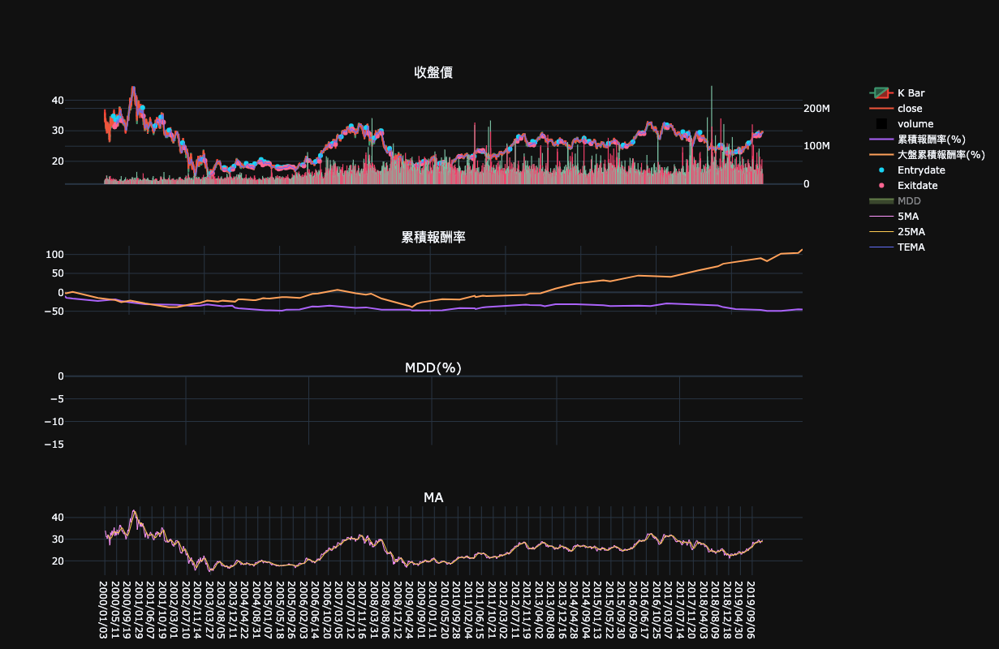

In [10]:
bt.get_plot(subplot_technical_index=['MA'], overlap=['TEMA'], sub_plot_param={'MA':[5, 25]}, overlap_param=None, log=trading_report)


# 回測策略:
  * 前一天收盤價大於5ma
  * 5MA、25MA 死叉

### 作多 + 加倉

In [8]:

class MyStrategy2(Strategy):
    
    def __init__(self):
        self.data = data
        self.tema_8 = self.indicator('TEMA', 8)['TEMA'].values
        self.tema_13 = self.indicator('TEMA', 13)['TEMA'].values

        
    def signal(self, index):

        super().signal(index)
        # Only buy the stock with empty position
        if (self.tema_8[index] > self.tema_13[index]) :
            self.long()
        # Only sell with long position
        if (self.tema_13[index] > self.tema_8[index]) :
            self.close()
        
        


In [9]:
%%time
bt = Backtest(MyStrategy2, initital_equity=10000, commission=0.01)
bt.run()


CPU times: user 899 ms, sys: 3.27 ms, total: 903 ms
Wall time: 902 ms


In [10]:
trading_report2, yearly_report2= bt.get_report()

/Users/apple/Documents/PythonProject/alphabt/alphabt/common/statistic.py:118: FutureWarning:

Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.



-----------------------------|
sharpe ratio | -2.122 --------|
-----------------------------|
calmar ratio | -0.033 --------|
-----------------------------|


/Users/apple/Documents/PythonProject/alphabt/alphabt/report/report.py:83: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



In [11]:
trading_report2

,Ticket,unit,action,EntryDate,EntryPrice,EntryCommission,Type,ExitDate,ExitPrice,Tax,ExitCommission,Equity,DurationDate,profit($),ROI(%),AccumulateROI(%),MDD(%),EquityReturn,EquityAccumulateReturn
0,T,1,long,2000-03-01,30.26,0.302587,normal,2000-03-10,31.39,0.0,0.313916,9802.273,9,1.13,3.734303,3.734,8.779,-1.977,-1.977
1,T,1,long,2000-03-02,32.48,0.324773,normal,2000-03-10,31.39,0.0,0.313916,9833.351,8,-1.09,-3.355911,0.253,8.779,0.317,-1.666
2,T,1,long,2000-03-03,34.37,0.343656,normal,2000-03-10,31.39,0.0,0.313916,9864.429,7,-2.98,-8.670352,-8.439,8.779,0.316,-1.356
3,T,1,long,2000-03-06,33.66,0.336575,normal,2000-03-10,31.39,0.0,0.313916,9895.507,4,-2.27,-6.743910,-14.614,4.179,0.315,-1.045
4,T,1,long,2000-03-07,32.90,0.329022,normal,2000-03-10,31.39,0.0,0.313916,9926.584,3,-1.51,-4.589666,-18.533,0.744,0.314,-0.734
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2520,T,1,long,2019-12-18,29.15,0.291541,normal,2019-12-26,29.45,0.0,0.294486,8699.063,8,0.30,1.029160,1367.781,0.485,0.336,-13.019
2521,T,1,long,2019-12-19,29.30,0.292976,normal,2019-12-26,29.45,0.0,0.294486,8728.217,7,0.15,0.511945,1375.295,0.485,0.335,-12.728
2522,T,1,long,2019-12-20,29.61,0.296148,normal,2019-12-26,29.45,0.0,0.294486,8757.371,6,-0.16,-0.540358,1367.324,0.485,0.334,-12.437
2523,T,1,long,2019-12-23,29.65,0.296450,normal,2019-12-26,29.45,0.0,0.294486,8786.525,3,-0.20,-0.674536,1357.426,0.281,0.333,-12.145


In [44]:
yearly_report2

,年度總損益(元),作多次數(次),作空次數(次),交易總次數(次),勝率(%),獲利因子,最大損失(元),最大獲利(元),個股年度報酬(%),當年度報酬率(%),平均交易報酬率(%),累積年度報酬(%),當年度權益報酬率(%),權益累積年度報酬(%),權益,年化報酬率(%),權益年化報酬率(%),大盤年化報酬率(%)
2000,-65.91,109,0,109,32.11,0.399,-7.0,3.0,-1.67,-84.33,-0.77,-84.33,-1.42,-1.42,9858,-84.33,-1.42,-9.27
2001,23.23,115,0,115,42.61,1.501,-2.0,4.0,-17.65,106.51,0.93,-67.64,-0.53,-1.94,9806,-43.11,-0.97,-11.18
2002,51.28,122,0,122,56.56,1.864,-3.0,4.0,-30.93,799.86,6.56,191.22,-0.05,-1.99,9801,42.80,-0.67,-15.44
2003,-21.98,130,0,130,33.08,0.561,-2.0,2.0,-6.56,-72.03,-0.55,-18.55,-0.70,-2.67,9732,-5.00,-0.67,-6.51
2004,-12.19,121,0,121,46.28,0.579,-2.0,2.0,-1.15,-47.03,-0.39,-56.85,-0.60,-3.26,9674,-15.47,-0.66,-3.59
2005,-6.06,109,0,109,38.53,0.666,-1.0,1.0,-5.74,-28.23,-0.26,-69.03,-0.48,-3.72,9628,-17.75,-0.63,-2.52
2006,31.57,132,0,132,50.00,2.702,-1.0,3.0,45.98,260.90,1.98,11.76,-0.28,-3.99,9601,1.60,-0.58,-0.37
2007,35.53,117,0,117,47.86,2.162,-2.0,2.0,16.51,253.33,2.17,294.89,-0.36,-4.33,9567,18.73,-0.55,0.11
2008,-23.25,126,0,126,37.30,0.655,-3.0,3.0,-31.34,-61.96,-0.49,50.20,-0.90,-5.19,9481,4.62,-0.59,-5.16
2009,-10.57,131,0,131,33.59,0.726,-1.0,2.0,-2.47,-41.95,-0.32,-12.82,-0.65,-5.81,9420,-1.36,-0.60,-2.63


/Users/apple/Documents/PythonProject/alphabt/alphabt/common/plot.py:81: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/apple/Documents/PythonProject/alphabt/alphabt/common/plot.py:82: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/apple/Documents/PythonProject/alphabt/alphabt/common/plot.py:104: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only

/Users/apple/Documents/PythonProject/alphabt/alphabt/common/plot.py:64: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only


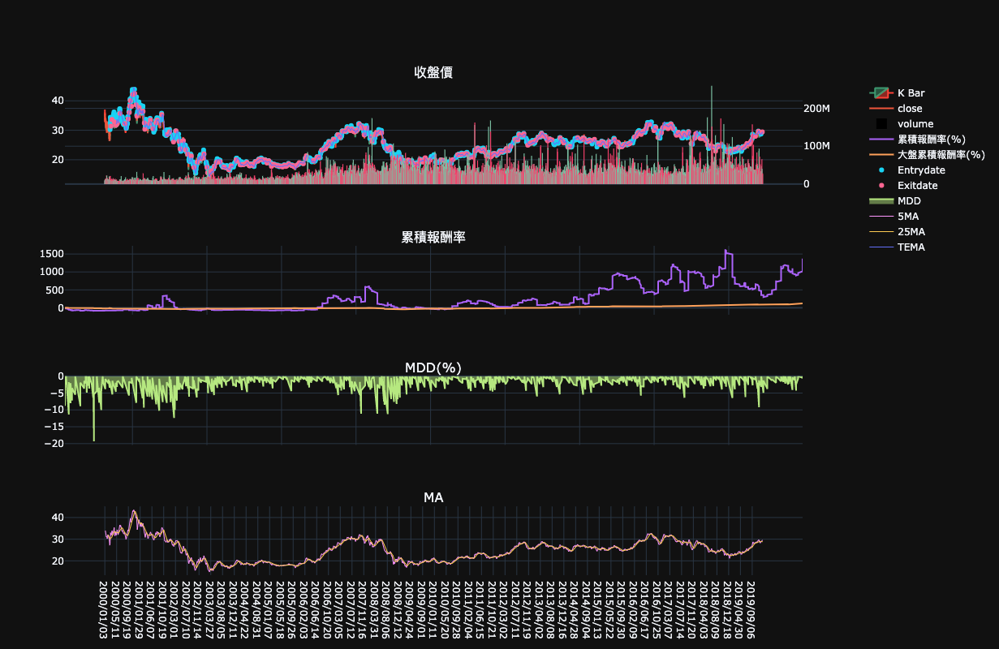

In [47]:
bt.get_plot(subplot_technical_index=['MA'], overlap=['TEMA'], sub_plot_param={'MA':[5, 25]}, overlap_param=None, log=trading_report2)
